## Cycle GAN

Wow 😅, It took 14 days to complete this notebook file.

Today, we will try to build CycleGAN model.

The paper is: [Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks (Zhu et al.)](https://arxiv.org/pdf/1703.10593.pdf).

In [1]:
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, \
    BatchNormalization, Add, LeakyReLU, ReLU
from tensorflow.keras.models import Model

### Define InstanceNormalization

Before we start, we will define InstanceNormalization class.

This definition is from `keras_contrib`, and also could be found on tensorflow addons.

I just **copied** it from github, cause I don't want to install more dependencies.

In [2]:
from tensorflow.keras.layers import Layer, InputSpec
from tensorflow.keras import initializers, regularizers, constraints
from tensorflow.keras import backend as K


class InstanceNormalization(Layer):
    """Instance normalization layer.
    Normalize the activations of the previous layer at each step,
    i.e. applies a transformation that maintains the mean activation
    close to 0 and the activation standard deviation close to 1.
    # Arguments
        axis: Integer, the axis that should be normalized
            (typically the features axis).
            For instance, after a `Conv2D` layer with
            `data_format="channels_first"`,
            set `axis=1` in `InstanceNormalization`.
            Setting `axis=None` will normalize all values in each
            instance of the batch.
            Axis 0 is the batch dimension. `axis` cannot be set to 0 to avoid errors.
        epsilon: Small float added to variance to avoid dividing by zero.
        center: If True, add offset of `beta` to normalized tensor.
            If False, `beta` is ignored.
        scale: If True, multiply by `gamma`.
            If False, `gamma` is not used.
            When the next layer is linear (also e.g. `nn.relu`),
            this can be disabled since the scaling
            will be done by the next layer.
        beta_initializer: Initializer for the beta weight.
        gamma_initializer: Initializer for the gamma weight.
        beta_regularizer: Optional regularizer for the beta weight.
        gamma_regularizer: Optional regularizer for the gamma weight.
        beta_constraint: Optional constraint for the beta weight.
        gamma_constraint: Optional constraint for the gamma weight.
    # Input shape
        Arbitrary. Use the keyword argument `input_shape`
        (tuple of integers, does not include the samples axis)
        when using this layer as the first layer in a Sequential model.
    # Output shape
        Same shape as input.
    # References
        - [Layer Normalization](https://arxiv.org/abs/1607.06450)
        - [Instance Normalization: The Missing Ingredient for Fast Stylization](
        https://arxiv.org/abs/1607.08022)
    """
    def __init__(self,
                 axis=None,
                 epsilon=1e-3,
                 center=True,
                 scale=True,
                 beta_initializer='zeros',
                 gamma_initializer='ones',
                 beta_regularizer=None,
                 gamma_regularizer=None,
                 beta_constraint=None,
                 gamma_constraint=None,
                 **kwargs):
        super(InstanceNormalization, self).__init__(**kwargs)
        self.supports_masking = True
        self.axis = axis
        self.epsilon = epsilon
        self.center = center
        self.scale = scale
        self.beta_initializer = initializers.get(beta_initializer)
        self.gamma_initializer = initializers.get(gamma_initializer)
        self.beta_regularizer = regularizers.get(beta_regularizer)
        self.gamma_regularizer = regularizers.get(gamma_regularizer)
        self.beta_constraint = constraints.get(beta_constraint)
        self.gamma_constraint = constraints.get(gamma_constraint)

    def build(self, input_shape):
        ndim = len(input_shape)
        if self.axis == 0:
            raise ValueError('Axis cannot be zero')

        if (self.axis is not None) and (ndim == 2):
            raise ValueError('Cannot specify axis for rank 1 tensor')

        self.input_spec = InputSpec(ndim=ndim)

        if self.axis is None:
            shape = (1,)
        else:
            shape = (input_shape[self.axis],)

        if self.scale:
            self.gamma = self.add_weight(shape=shape,
                                         name='gamma',
                                         initializer=self.gamma_initializer,
                                         regularizer=self.gamma_regularizer,
                                         constraint=self.gamma_constraint)
        else:
            self.gamma = None
        if self.center:
            self.beta = self.add_weight(shape=shape,
                                        name='beta',
                                        initializer=self.beta_initializer,
                                        regularizer=self.beta_regularizer,
                                        constraint=self.beta_constraint)
        else:
            self.beta = None
        self.built = True

    def call(self, inputs, training=None):
        input_shape = K.int_shape(inputs)
        reduction_axes = list(range(0, len(input_shape)))

        if self.axis is not None:
            del reduction_axes[self.axis]

        del reduction_axes[0]

        mean = K.mean(inputs, reduction_axes, keepdims=True)
        stddev = K.std(inputs, reduction_axes, keepdims=True) + self.epsilon
        normed = (inputs - mean) / stddev

        broadcast_shape = [1] * len(input_shape)
        if self.axis is not None:
            broadcast_shape[self.axis] = input_shape[self.axis]

        if self.scale:
            broadcast_gamma = K.reshape(self.gamma, broadcast_shape)
            normed = normed * broadcast_gamma
        if self.center:
            broadcast_beta = K.reshape(self.beta, broadcast_shape)
            normed = normed + broadcast_beta
        return normed

    def get_config(self):
        config = {
            'axis': self.axis,
            'epsilon': self.epsilon,
            'center': self.center,
            'scale': self.scale,
            'beta_initializer': initializers.serialize(self.beta_initializer),
            'gamma_initializer': initializers.serialize(self.gamma_initializer),
            'beta_regularizer': regularizers.serialize(self.beta_regularizer),
            'gamma_regularizer': regularizers.serialize(self.gamma_regularizer),
            'beta_constraint': constraints.serialize(self.beta_constraint),
            'gamma_constraint': constraints.serialize(self.gamma_constraint)
        }
        base_config = super(InstanceNormalization, self).get_config()
        return dict(list(base_config.items()) + list(config.items()))

### Build generator

Below are functions which defines generator, and its components.

Things to check:
- We don't apply InstanceNormalization on first Conv2D.
- We use 9 resblocks, on the middle. (or you can use u-net like arch)
- The output activation is tanh function, for range [-1, 1].

In [3]:
"""
skipping instance normalization after con2d
"""

img_shape = (256, 256, 3)

def res_block(_in):
    x = Conv2D(256, 3, padding='same', strides=1, kernel_initializer='he_normal')(_in)
    x = InstanceNormalization(axis=-1)(x)
    x = ReLU()(x)
    
    x = Conv2D(256, 3, padding='same', strides=1, kernel_initializer='he_normal')(x)
    x = InstanceNormalization(axis=-1)(x)
    
    x = Add()([x, _in])
    x = ReLU()(x)
    
    return x

def build_gen():
    _in = Input(shape=img_shape)
    
    x = Conv2D(64, 7, activation='relu', padding='same', strides=1, kernel_initializer='he_normal')(_in)
    x = Conv2D(128, 3, activation='relu', padding='same', strides=2, kernel_initializer='he_normal')(x)
    x = InstanceNormalization(axis=-1)(x)
    x = Conv2D(256, 3, activation='relu', padding='same', strides=2, kernel_initializer='he_normal')(x)
    x = InstanceNormalization(axis=-1)(x)
    
    for i in range(9):
        x = res_block(x)

    x = Conv2DTranspose(128, 3, activation='relu', padding='same', strides=2, kernel_initializer='he_normal')(x)
    x = InstanceNormalization(axis=-1)(x)
    x = Conv2DTranspose(64, 3, activation='relu', padding='same', strides=2, kernel_initializer='he_normal')(x)
    x = InstanceNormalization(axis=-1)(x)
    x = Conv2D(3, 7, activation='tanh', padding='same', strides=1)(x)
    
    return Model(inputs=_in, outputs=x)

build_gen().summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 256, 256, 64) 9472        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 128 73856       conv2d[0][0]                     
__________________________________________________________________________________________________
instance_normalization (Instanc (None, 128, 128, 128 256         conv2d_1[0][0]                   
______________________________________________________________________________________________

### Build discriminator

Below are functions which defines discriminator and its components.

Things to check:
- The output shape is (16, 16, 1).

In [4]:
def dis_conv_block(_in, filters, norm=True):
    x = Conv2D(filters, 4, padding='same', strides=2, kernel_initializer='he_normal')(_in)
    if norm:
        x = InstanceNormalization(axis=-1)(x)
    x = LeakyReLU(0.2)(x)
    
    return x

def build_dis():
    _in = Input(shape=img_shape)
    
    x = dis_conv_block(_in, 64, norm=False)
    for filters in [128, 256, 512]:
        x = dis_conv_block(x, filters)

    x = Conv2D(1, 4, activation='sigmoid', padding='same', strides=1)(x)
    
    return Model(inputs=_in, outputs=x)

build_dis().summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 256, 256, 3)]     0         
_________________________________________________________________
conv2d_22 (Conv2D)           (None, 128, 128, 64)      3136      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_23 (Conv2D)           (None, 64, 64, 128)       131200    
_________________________________________________________________
instance_normalization_22 (I (None, 64, 64, 128)       256       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 64, 64, 128)       0         
_________________________________________________________________
conv2d_24 (Conv2D)           (None, 32, 32, 256)       5245

### Compile/Build model

First, we compile discriminators, with crossentropy.
Next, we compile gen-dis model. It has 3 losses: discriminator loss (crossentropy), reconstruction loss (mae), identity loss (mae).

For gen-dis model:
- Discriminator loss: objects to np.ones.
- Reconstruction loss: objects to original image.
- Identity loss: objects to original image.

In [5]:
def build_model():
    gen_A = build_gen()
    gen_B = build_gen()
    dis_A = build_dis()
    dis_B = build_dis()
    
    dis_A.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    dis_B.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    dis_A.trainable = False
    dis_B.trainable = False
    
    real_A = Input(shape=img_shape)
    real_B = Input(shape=img_shape)
    
    fake_A = gen_A(real_B)
    dis_fake_A = dis_A(fake_A)
    
    fake_B = gen_B(real_A)
    dis_fake_B = dis_B(fake_B)
    
    rc_A = gen_A(fake_B)
    rc_B = gen_B(fake_A)
    
    id_A = gen_A(real_A)
    id_B = gen_B(real_B)
    
    model = Model(
        inputs=[real_A, real_B],
        outputs=[dis_fake_A, dis_fake_B, rc_A, rc_B, id_A, id_B]
    )
    
    model.compile(
        loss=['binary_crossentropy', 'binary_crossentropy', 'mae', 'mae', 'mae', 'mae'],
        loss_weights=[1, 1, 10, 10, 2, 2],
        optimizer='adam'
    )
    
    return (model, gen_A, gen_B, dis_A, dis_B)

model, gen_A, gen_B, dis_A, dis_B = build_model()

### Prepare dataset

Dataset for CycleGAN is provided from website of Tae Sung Park, the co-author of paper.

We will try summer2winter yosemite dataset.

If you wish, you could try with different dataset, donwloadable on [here](https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets).

In [6]:
!sudo apt install unzip
!wget -N https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/summer2winter_yosemite.zip --no-check-certificate
!unzip -n -q summer2winter_yosemite.zip
!mkdir backup/

Reading package lists... Done
Building dependency tree       
Reading state information... Done
unzip is already the newest version (6.0-20ubuntu1).
0 upgraded, 0 newly installed, 0 to remove and 105 not upgraded.
--2020-10-06 15:05:33--  https://people.eecs.berkeley.edu/~taesung_park/CycleGAN/datasets/summer2winter_yosemite.zip
Resolving people.eecs.berkeley.edu (people.eecs.berkeley.edu)... 128.32.189.73
Connecting to people.eecs.berkeley.edu (people.eecs.berkeley.edu)|128.32.189.73|:443... connected.
  Issued certificate has expired.
HTTP request sent, awaiting response... 200 OK
Length: 132640856 (126M) [application/zip]
Saving to: ‘summer2winter_yosemite.zip’

summer2winter_yosem 100%[===================>] 126.50M  17.2MB/s    in 8.8s    

2020-10-06 15:05:43 (14.3 MB/s) - ‘summer2winter_yosemite.zip’ saved [132640856/132640856]



### Define DataGenerator

In here, we define:
- preprocessing, deprprocessing functions on image.
- class that returns iterator, loads images.

Check the constructor: we sort the image paths, truncate to min length, and shuffle it.

In [7]:
import os
import glob
import numpy as np
import random

from tensorflow.keras.preprocessing.image import load_img


def preprocess_img(img):
    return (img / 127.5) - 1.

def depreprocess_img(img):
    return ((img + 1.) * 127.5).astype(np.uint8)


class DataGenerator:
    def __init__(self, path_A, path_B, batch=1, ext = 'jpg'):
        img_paths_A = sorted(glob.glob(os.path.join(path_A, '*.%s' % ext)))
        img_paths_B = sorted(glob.glob(os.path.join(path_B, '*.%s' % ext)))
        img_length = min(len(img_paths_A), len(img_paths_B))
        
        img_paths_A = img_paths_A[:img_length]
        img_paths_B = img_paths_B[:img_length]

        random.shuffle(img_paths_A)
        random.shuffle(img_paths_B)

        self.idx = 0
        self.img_paths_A = img_paths_A
        self.img_paths_B = img_paths_B
        self.batch = batch
        self.length = img_length // self.batch
        
    def __iter__(self):
        self.idx = 0
        return self

    def __next__(self):
        i = self.idx
        if (i >= len(self)):
            raise StopIteration
        
        curr_paths_A = self.img_paths_A[i*self.batch:(i+1)*self.batch]
        curr_paths_B = self.img_paths_B[i*self.batch:(i+1)*self.batch]

        imgs_A = self.load_imgs(curr_paths_A)
        imgs_B = self.load_imgs(curr_paths_B)

        self.idx += 1
        return (np.array(imgs_A), np.array(imgs_B))
    
    def __len__(self):
        return self.length

    @staticmethod
    def load_imgs(paths):
        imgs = []
        for path in paths:
            img = np.array(load_img(path))
            img = preprocess_img(img)
            
            if np.random.random() > 0.5:
                img = np.fliplr(img)
            
            imgs.append(img)
        return imgs

### Train!

Now it's trainig time!

On every epoch, we will save losses on list.

On every 10 epochs, we will save the model as h5 file, and plot generated images.

[Epoch: 1 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 1 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 2 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 2 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 3 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 3 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 4 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 4 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 5 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 5 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 6 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 6 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 7 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 7 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 8 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 8 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 9 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 9 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 10 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 10 / Total: 200 / Batch: 500 / Total: 962]


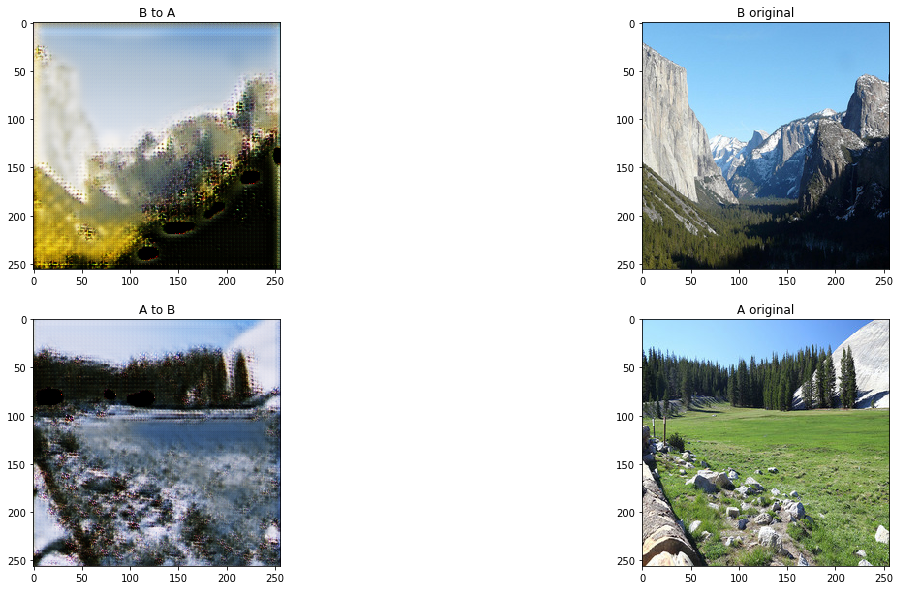

[Epoch: 11 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 11 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 12 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 12 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 13 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 13 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 14 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 14 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 15 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 15 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 16 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 16 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 17 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 17 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 18 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 18 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 19 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 19 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 20 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 20 / Total: 200 / Batch: 500 / Total: 962]


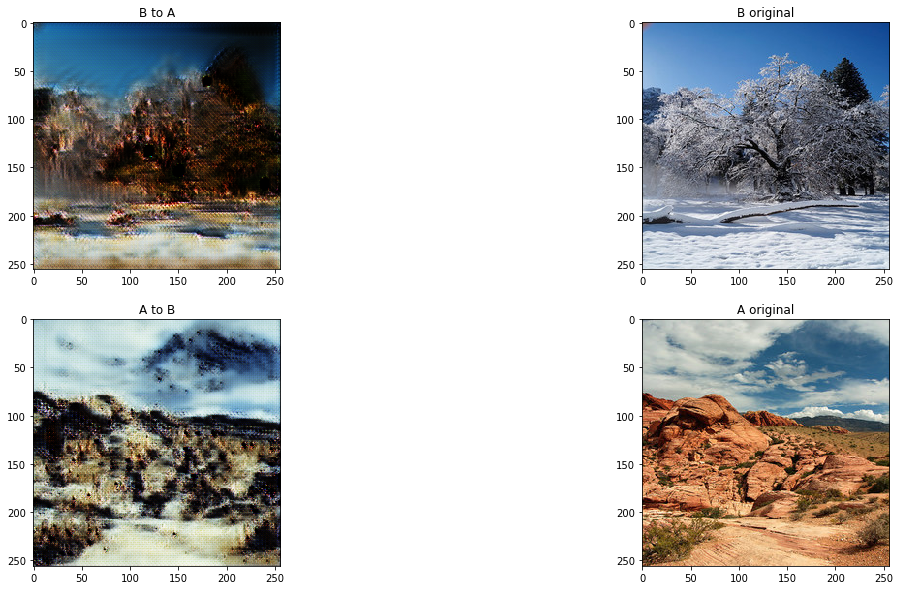

[Epoch: 21 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 21 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 22 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 22 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 23 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 23 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 24 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 24 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 25 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 25 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 26 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 26 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 27 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 27 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 28 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 28 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 29 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 29 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 30 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 30 / Total: 200 / Batch: 500 / Total: 962]


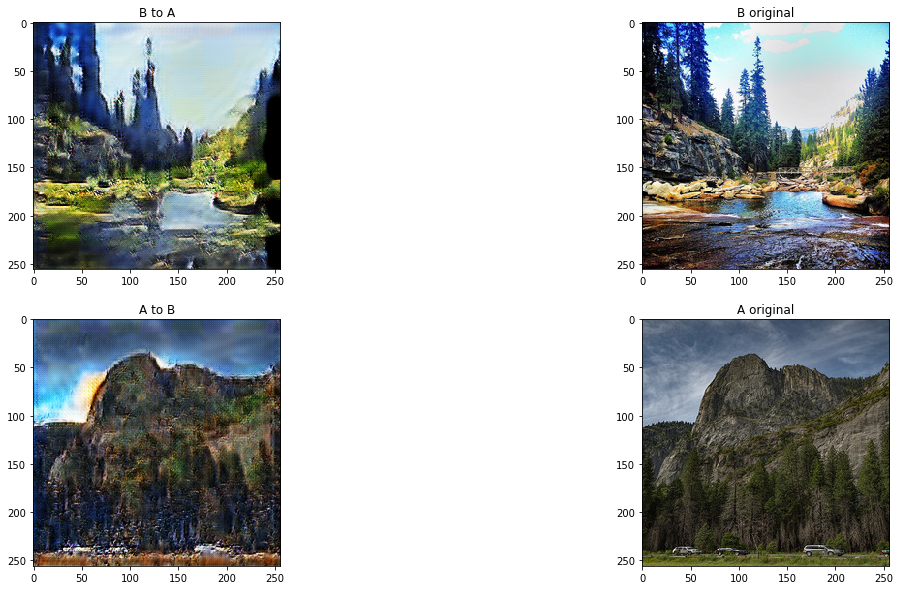

[Epoch: 31 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 31 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 32 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 32 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 33 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 33 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 34 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 34 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 35 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 35 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 36 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 36 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 37 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 37 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 38 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 38 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 39 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 39 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 40 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 40 / Total: 200 / Batch: 500 / Total: 962]


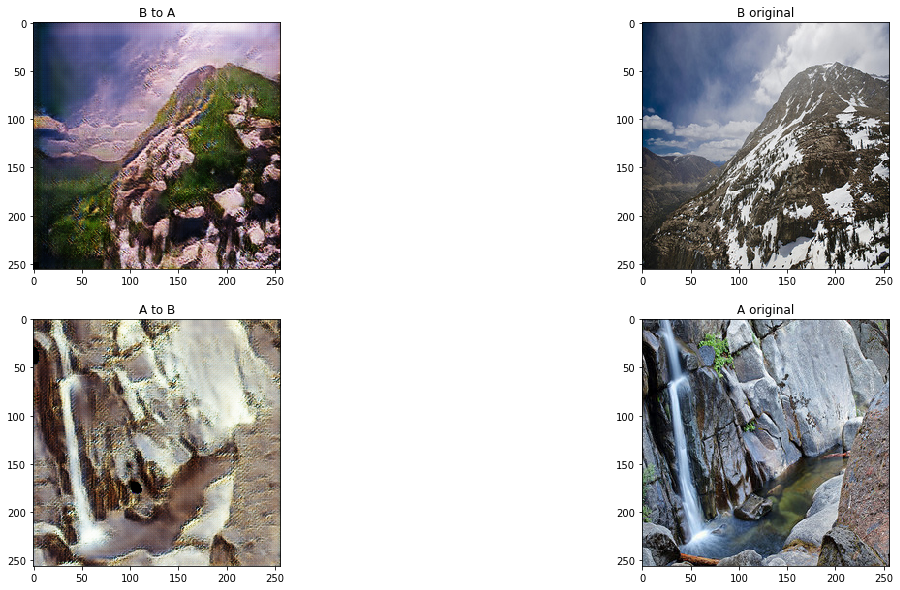

[Epoch: 41 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 41 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 42 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 42 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 43 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 43 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 44 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 44 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 45 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 45 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 46 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 46 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 47 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 47 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 48 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 48 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 49 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 49 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 50 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 50 / Total: 200 / Batch: 500 / Total: 962]


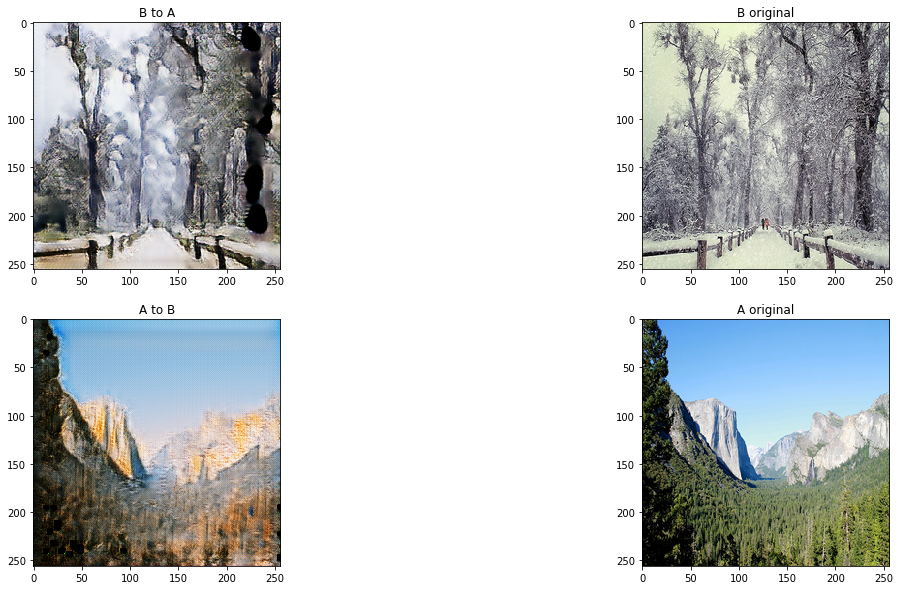

[Epoch: 51 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 51 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 52 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 52 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 53 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 53 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 54 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 54 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 55 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 55 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 56 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 56 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 57 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 57 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 58 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 58 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 59 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 59 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 60 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 60 / Total: 200 / Batch: 500 / Total: 962]


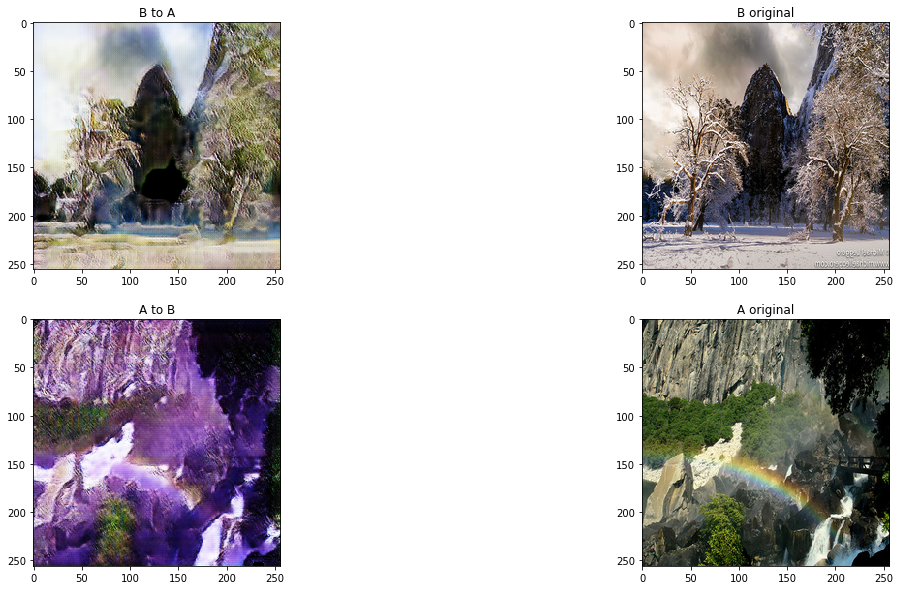

[Epoch: 61 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 61 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 62 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 62 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 63 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 63 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 64 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 64 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 65 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 65 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 66 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 66 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 67 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 67 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 68 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 68 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 69 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 69 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 70 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 70 / Total: 200 / Batch: 500 / Total: 962]


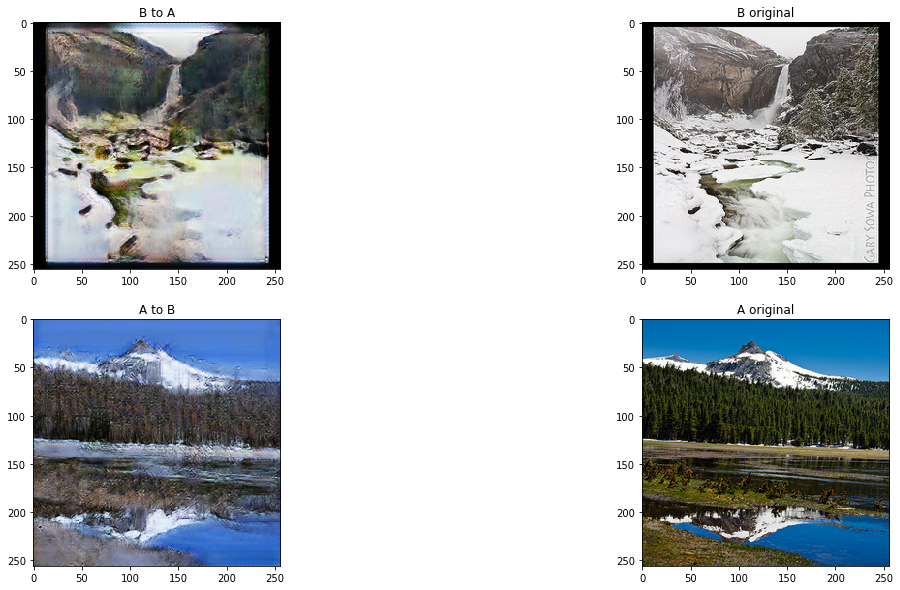

[Epoch: 71 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 71 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 72 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 72 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 73 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 73 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 74 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 74 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 75 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 75 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 76 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 76 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 77 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 77 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 78 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 78 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 79 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 79 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 80 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 80 / Total: 200 / Batch: 500 / Total: 962]


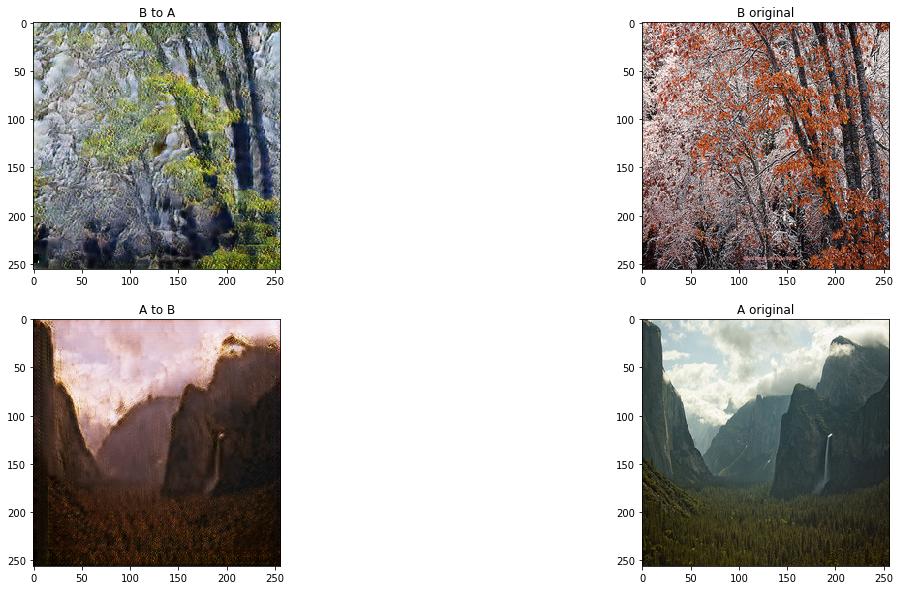

[Epoch: 81 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 81 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 82 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 82 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 83 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 83 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 84 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 84 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 85 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 85 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 86 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 86 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 87 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 87 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 88 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 88 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 89 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 89 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 90 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 90 / Total: 200 / Batch: 500 / Total: 962]


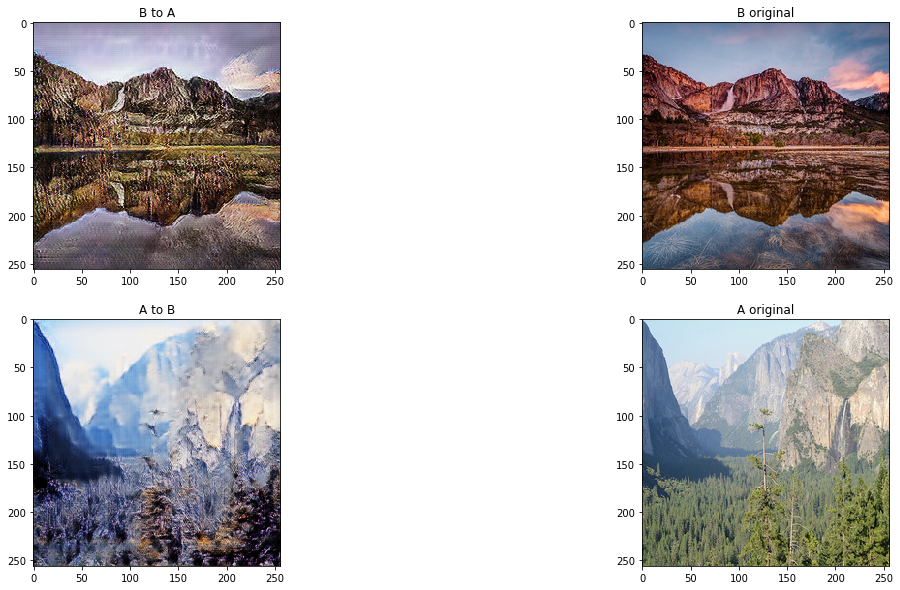

[Epoch: 91 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 91 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 92 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 92 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 93 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 93 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 94 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 94 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 95 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 95 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 96 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 96 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 97 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 97 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 98 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 98 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 99 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 99 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 100 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 100 / Total: 200 / Batch: 500 / Total: 962

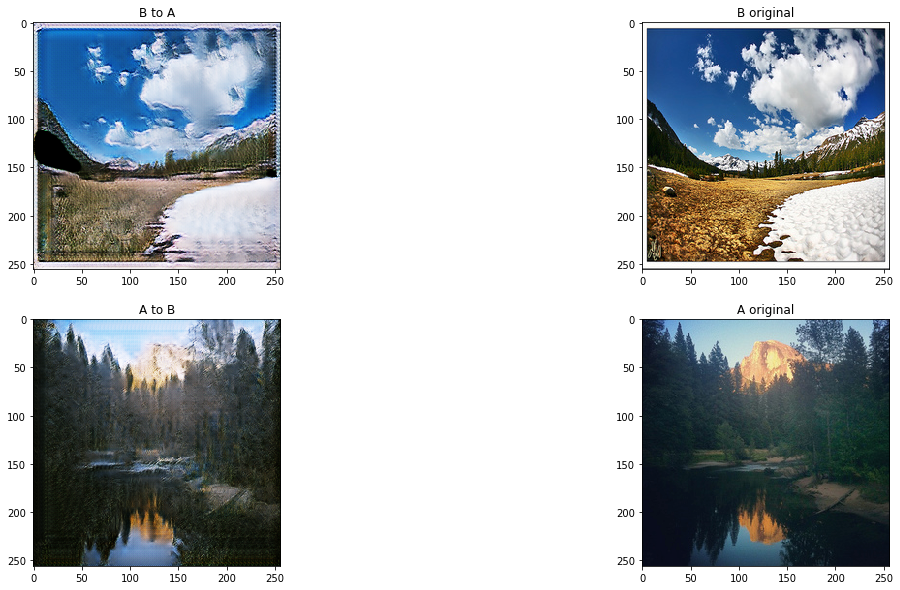

[Epoch: 101 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 101 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 102 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 102 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 103 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 103 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 104 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 104 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 105 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 105 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 106 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 106 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 107 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 107 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 108 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 108 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 109 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 109 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 110 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 110 / Total: 200 / Batch

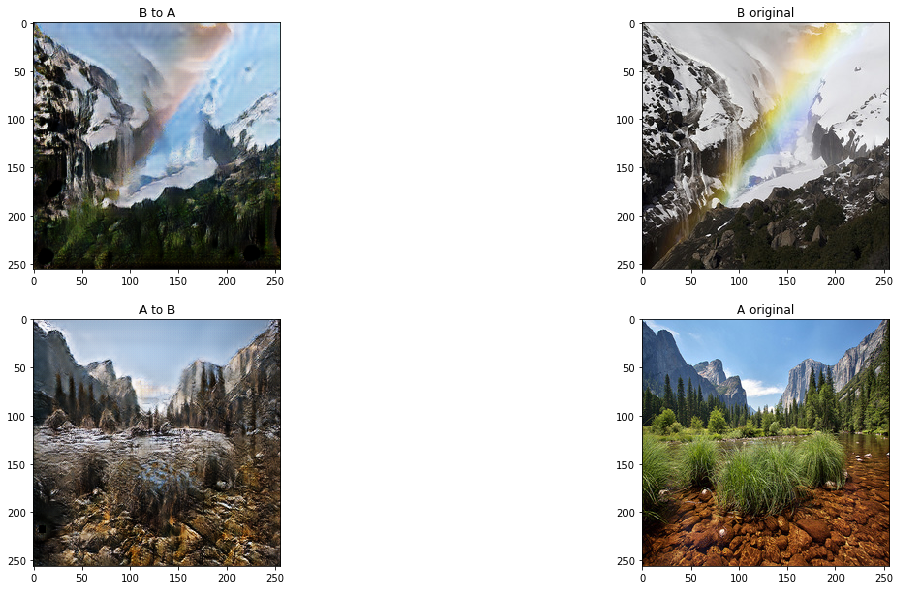

[Epoch: 111 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 111 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 112 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 112 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 113 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 113 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 114 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 114 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 115 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 115 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 116 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 116 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 117 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 117 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 118 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 118 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 119 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 119 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 120 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 120 / Total: 200 / Batch

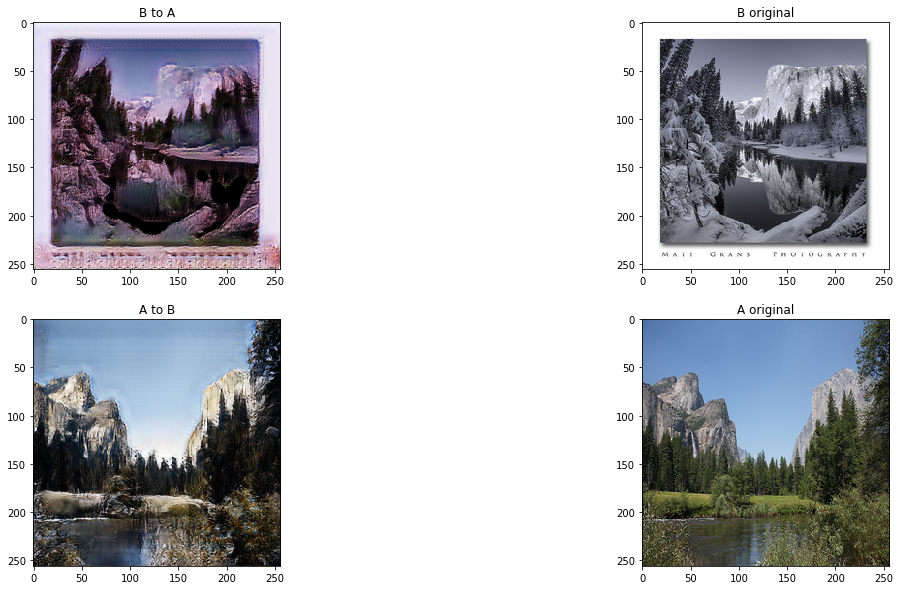

[Epoch: 121 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 121 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 122 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 122 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 123 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 123 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 124 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 124 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 125 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 125 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 126 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 126 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 127 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 127 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 128 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 128 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 129 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 129 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 130 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 130 / Total: 200 / Batch

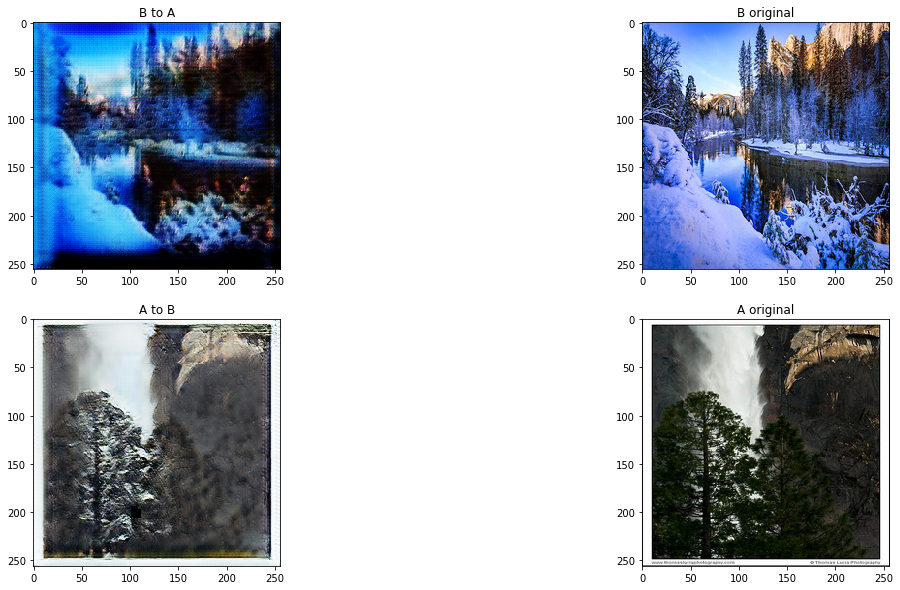

[Epoch: 131 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 131 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 132 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 132 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 133 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 133 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 134 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 134 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 135 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 135 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 136 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 136 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 137 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 137 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 138 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 138 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 139 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 139 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 140 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 140 / Total: 200 / Batch

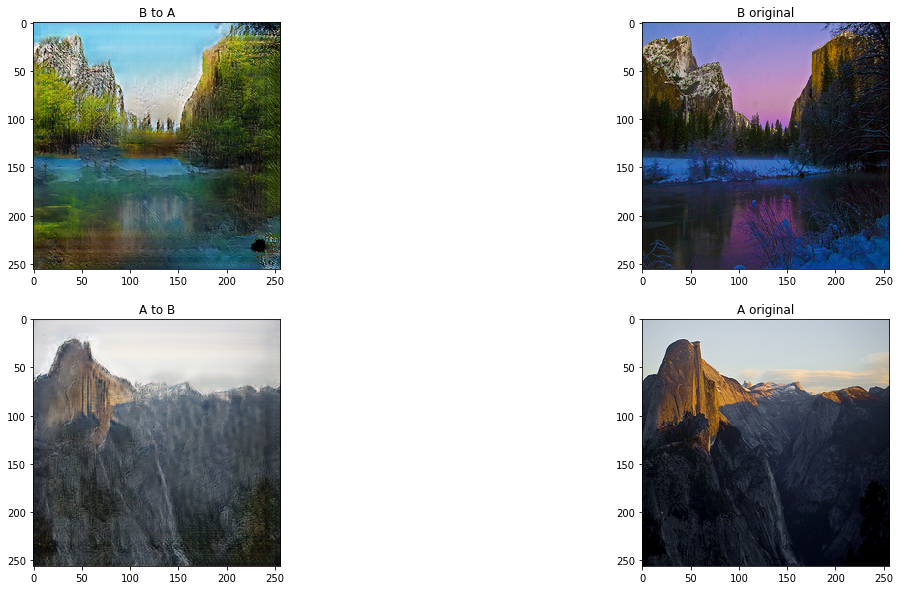

[Epoch: 141 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 141 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 142 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 142 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 143 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 143 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 144 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 144 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 145 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 145 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 146 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 146 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 147 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 147 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 148 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 148 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 149 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 149 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 150 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 150 / Total: 200 / Batch

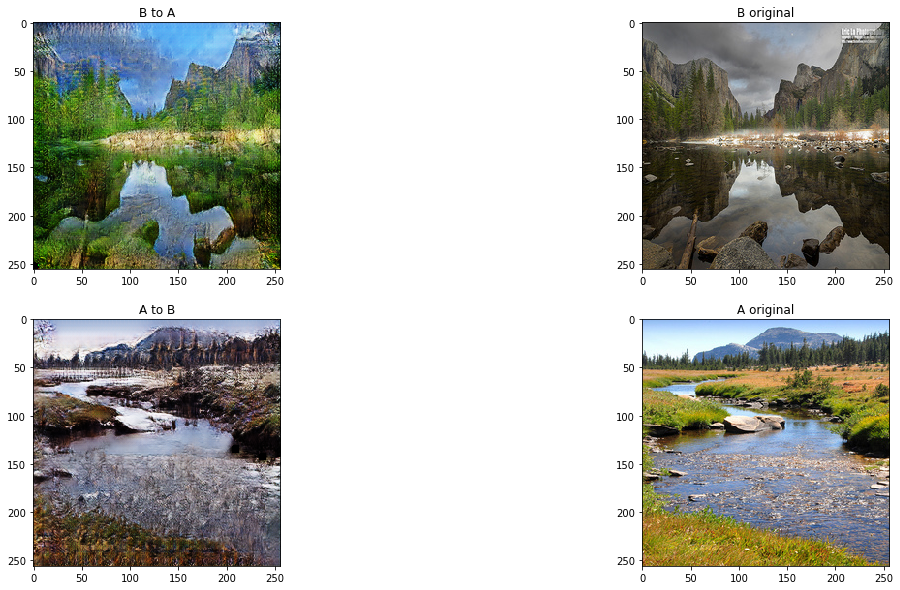

[Epoch: 151 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 151 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 152 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 152 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 153 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 153 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 154 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 154 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 155 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 155 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 156 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 156 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 157 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 157 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 158 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 158 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 159 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 159 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 160 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 160 / Total: 200 / Batch

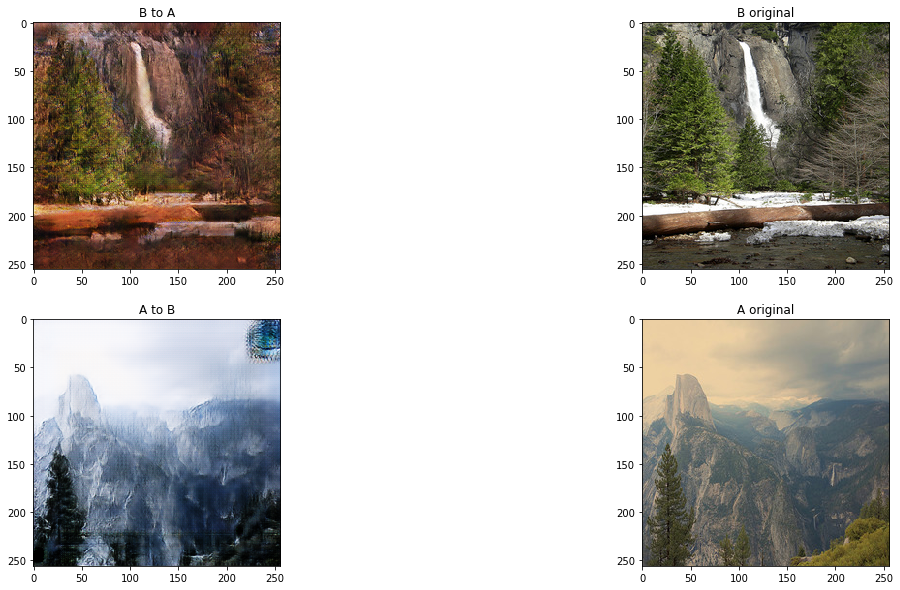

[Epoch: 161 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 161 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 162 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 162 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 163 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 163 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 164 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 164 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 165 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 165 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 166 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 166 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 167 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 167 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 168 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 168 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 169 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 169 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 170 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 170 / Total: 200 / Batch

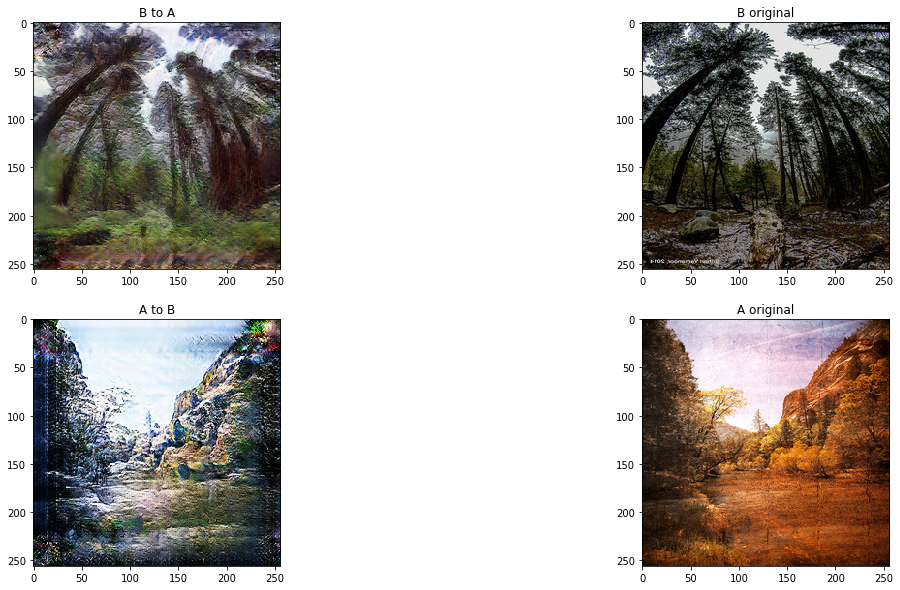

[Epoch: 171 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 171 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 172 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 172 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 173 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 173 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 174 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 174 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 175 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 175 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 176 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 176 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 177 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 177 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 178 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 178 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 179 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 179 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 180 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 180 / Total: 200 / Batch

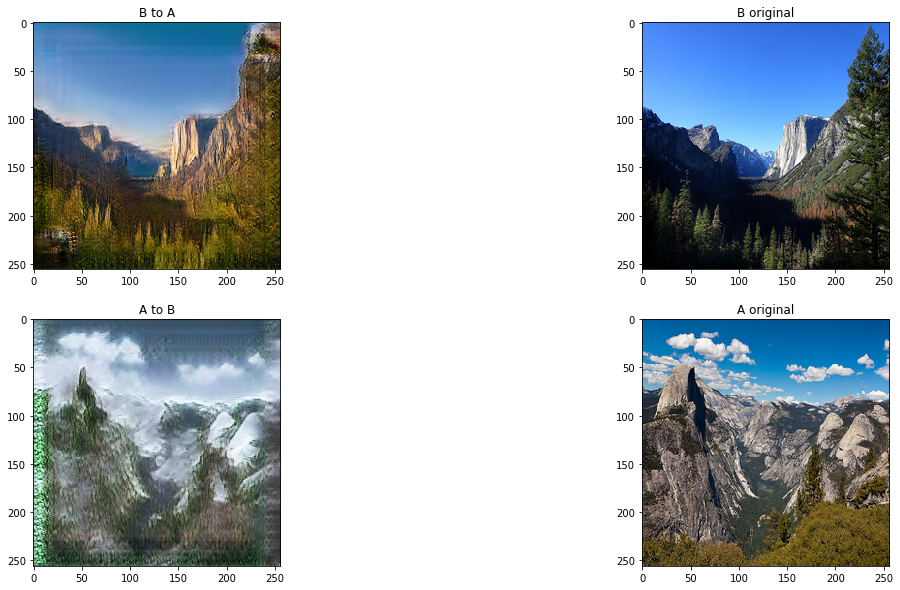

[Epoch: 181 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 181 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 182 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 182 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 183 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 183 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 184 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 184 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 185 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 185 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 186 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 186 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 187 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 187 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 188 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 188 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 189 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 189 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 190 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 190 / Total: 200 / Batch

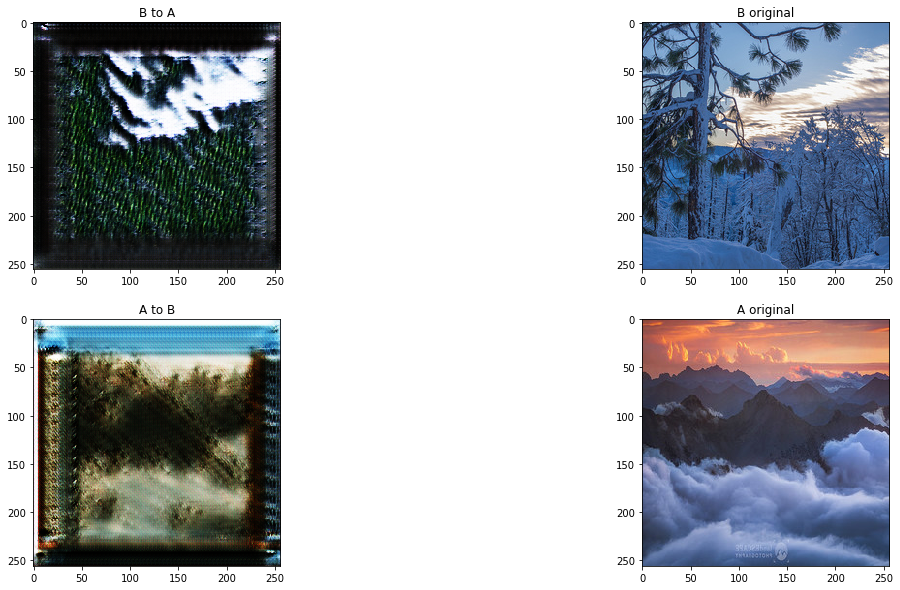

[Epoch: 191 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 191 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 192 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 192 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 193 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 193 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 194 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 194 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 195 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 195 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 196 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 196 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 197 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 197 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 198 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 198 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 199 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 199 / Total: 200 / Batch: 500 / Total: 962]
[Epoch: 200 / Total: 200 / Batch: 0 / Total: 962]
[Epoch: 200 / Total: 200 / Batch

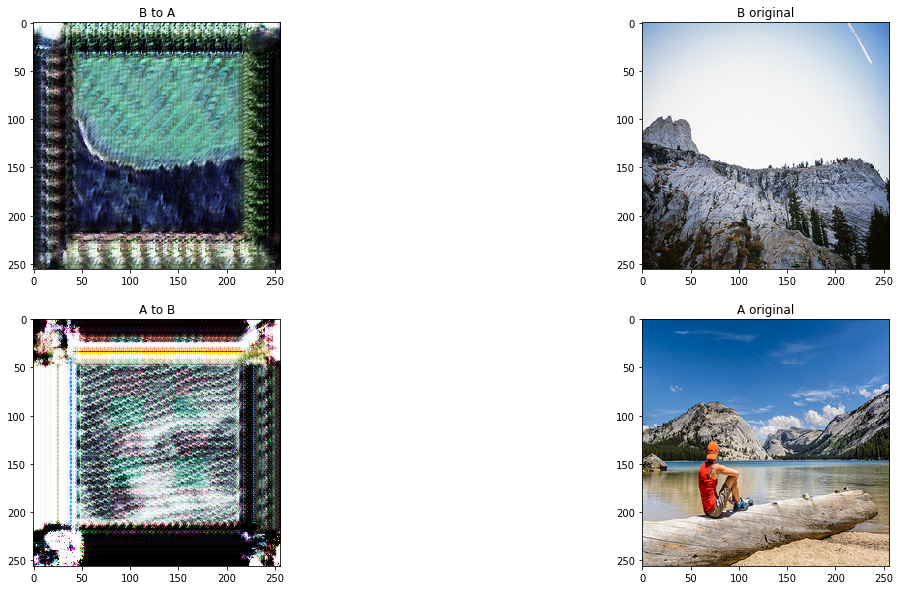

In [8]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt

dis_output_shape = dis_A.output.shape[1:]

epochs = 200
dis_A_loss = []
dis_B_loss = []
model_dis_loss = []
model_rc_loss = []
model_id_loss = []
for epoch in range(1, epochs+1):
    gens = DataGenerator('./summer2winter_yosemite/trainA/', './summer2winter_yosemite/trainB/')
    for gen_idx, (imgs_A, imgs_B) in enumerate(gens):
        if gen_idx % 500 == 0:
            print("[Epoch: %d / Total: %d / Batch: %d / Total: %d]" % (epoch, epochs, gen_idx, len(gens)))
        
        fakes_A = gen_A.predict(imgs_B)
        fakes_B = gen_B.predict(imgs_A)
        
        dis_A_loss_one = dis_A.train_on_batch(imgs_A, y=np.ones((len(imgs_A), *dis_output_shape)))
        dis_A_loss_zero = dis_A.train_on_batch(fakes_A, y=np.zeros((len(fakes_A), *dis_output_shape)))

        dis_B_loss_one = dis_B.train_on_batch(imgs_B, y=np.ones((len(imgs_B), *dis_output_shape)))
        dis_B_loss_zero = dis_B.train_on_batch(fakes_B, y=np.zeros((len(fakes_B), *dis_output_shape)))
        
        model_loss = model.train_on_batch(
            [imgs_A, imgs_B],
            [
                np.ones((len(imgs_A), *dis_output_shape)), np.ones((len(imgs_B), *dis_output_shape)),
                imgs_A, imgs_B,
                imgs_A, imgs_B
            ]
        )
        
        dis_A_loss.append(dis_A_loss_one[0] + dis_A_loss_zero[0])
        dis_B_loss.append(dis_B_loss_one[0] + dis_B_loss_zero[0])
        model_dis_loss.append(model_loss[1] + model_loss[2])
        model_rc_loss.append(model_loss[3] + model_loss[4])
        model_id_loss.append(model_loss[5] + model_loss[6])
    
    if epoch % 10 == 0:
        # backup
        gen_A.save('backup/gen_A_%03d.h5' % epoch)
        gen_B.save('backup/gen_B_%03d.h5' % epoch)
        
        plt.figure(figsize=(20, 10))
        
        plt.subplot(2, 2, 1)
        plt.title('B to A')
        plt.imshow(depreprocess_img(fakes_A[0, :, :, :]))
        plt.subplot(2, 2, 2)
        plt.title('B original')
        plt.imshow(depreprocess_img(imgs_B[0, :, :, :]))
        plt.subplot(2, 2, 3)
        plt.title('A to B')
        plt.imshow(depreprocess_img(fakes_B[0, :, :, :]))
        plt.subplot(2, 2, 4)
        plt.title('A original')
        plt.imshow(depreprocess_img(imgs_A[0, :, :, :]))
        plt.show()

### Prediction in TestSet

150th epoch result seems ok, we will load that model to predict images.

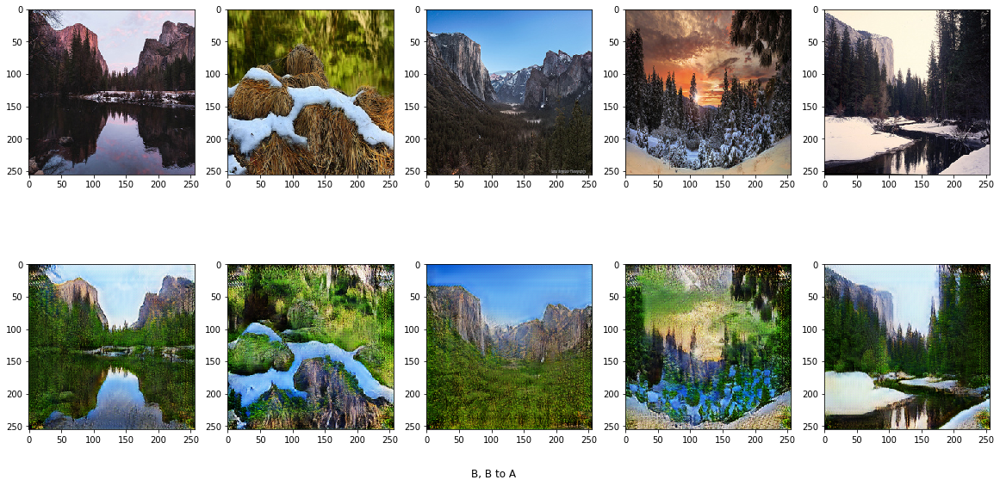

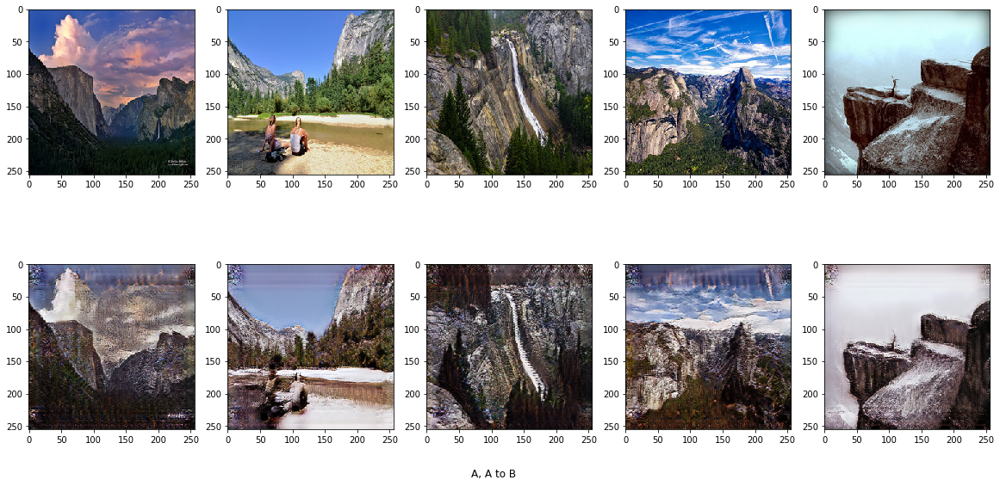

In [25]:
from tensorflow.keras.models import load_model

gens = DataGenerator('./summer2winter_yosemite/testA/', './summer2winter_yosemite/testB/', batch=5)
(imgs_A, imgs_B) = next(gens)

custom_objects = {'InstanceNormalization': InstanceNormalization}
fakes_A = load_model('backup/gen_A_150.h5', custom_objects=custom_objects).predict(imgs_B)
fakes_B = load_model('backup/gen_B_150.h5', custom_objects=custom_objects).predict(imgs_A)

plt.figure(figsize=(20, 10))
plt.suptitle("B, B to A", y=0.1)
for i in range(5):
    plt.subplot(2, 5, i+1)
    plt.imshow(depreprocess_img(imgs_B[i, :, :, :]))
    plt.subplot(2, 5, i+5+1)
    plt.imshow(depreprocess_img(fakes_A[i, :, :, :]))
plt.show()

plt.figure(figsize=(20, 10))
plt.suptitle("A, A to B", y=0.1)
for i in range(5):
    plt.subplot(2, 5, i+1)
    plt.imshow(depreprocess_img(imgs_A[i, :, :, :]))
    plt.subplot(2, 5, i+5+1)
    plt.imshow(depreprocess_img(fakes_B[i, :, :, :]))
plt.show()

### Plot loss

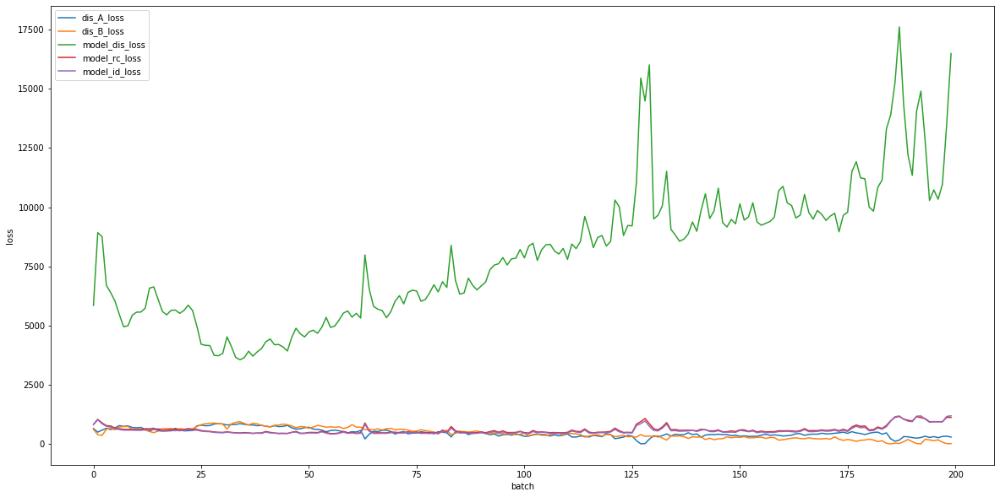

In [26]:
plt.figure(figsize=(20, 10))
plt.xlabel('batch')
plt.ylabel('loss')

def batch_to_epochs(l, b_per_e):
    return np.add.reduceat(l, np.arange(0, len(l), b_per_e))

gens = DataGenerator('./summer2winter_yosemite/trainA/', './summer2winter_yosemite/trainB/')
plt.plot(batch_to_epochs(dis_A_loss, len(gens)), label='dis_A_loss')
plt.plot(batch_to_epochs(dis_B_loss, len(gens)), label='dis_B_loss')
plt.plot(batch_to_epochs(model_dis_loss, len(gens)), label='model_dis_loss')
plt.plot(batch_to_epochs(model_rc_loss, len(gens)), label='model_rc_loss')
plt.plot(batch_to_epochs(model_id_loss, len(gens)), label='model_id_loss')

plt.legend()